# Breast Cancer Dataset from Kaggle

# Loading in the dataset

In [2]:
#Breast Cancer Dataset from Kaggle
import pandas as pd
import numpy as np
url = 'C:/Users/tanw/Desktop/Kaggle/breastcancerdata.csv'
breastcancerdata = pd.read_csv(url)

#The following creates a numerical feature 'diagnosisnew' out of string feature 'diagnosis', then removes the string feature.
#Also removes an empty column that exists in the dataset
#Replaces the entire dataset with the edited one.
breastcancerdata['diagnosisnew'] = breastcancerdata.diagnosis.map({'B':0, 'M':1})
breastcancerdata = breastcancerdata.drop(['diagnosis', 'Unnamed: 32'], axis=1)

#Visualise the table
breastcancerdata.head()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosisnew
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,1
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,1
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,1
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,1
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,1


In [3]:
#List the columns
breastcancerdata.columns.tolist()

['id',
 'radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'smoothness_mean',
 'compactness_mean',
 'concavity_mean',
 'concave points_mean',
 'symmetry_mean',
 'fractal_dimension_mean',
 'radius_se',
 'texture_se',
 'perimeter_se',
 'area_se',
 'smoothness_se',
 'compactness_se',
 'concavity_se',
 'concave points_se',
 'symmetry_se',
 'fractal_dimension_se',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst',
 'smoothness_worst',
 'compactness_worst',
 'concavity_worst',
 'concave points_worst',
 'symmetry_worst',
 'fractal_dimension_worst',
 'diagnosisnew']

We want to predict *diagnosisnew*, which is a numerical feature with 2 classes, **0** and **1**. This can be framed in several ways, and investigated using several models: 

(1) As a *logistic regression* (or more specifically, a softmax logistic regression problem);

(2) As a *clustering* problem (using k-means clustering);

(3) As a potential problem set for a *neural network*.

Let's create a plot to visualise the relationships of the features with the diagnosis.

In [19]:
#Import the relevant packages
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['font.size'] = 14

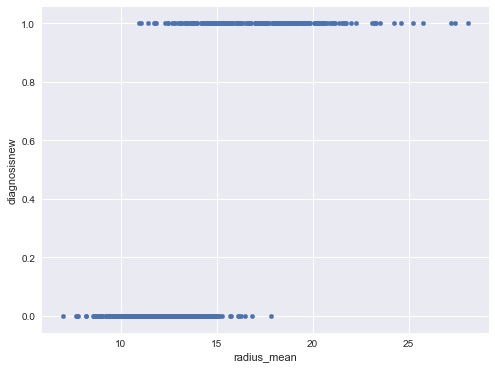

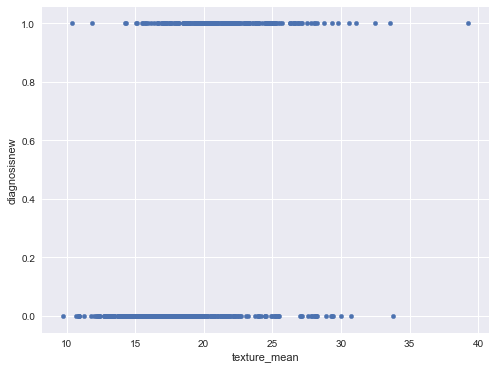

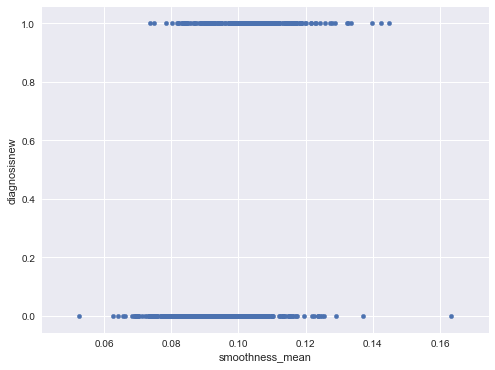

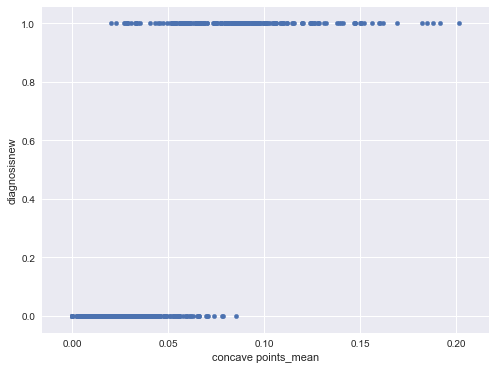

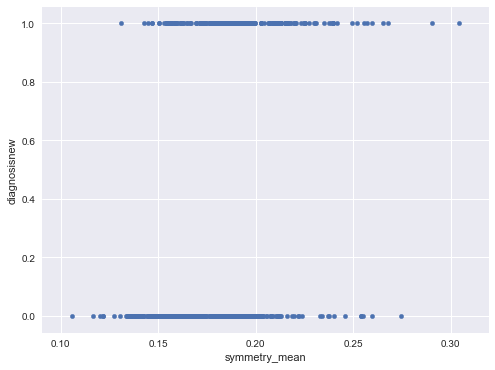

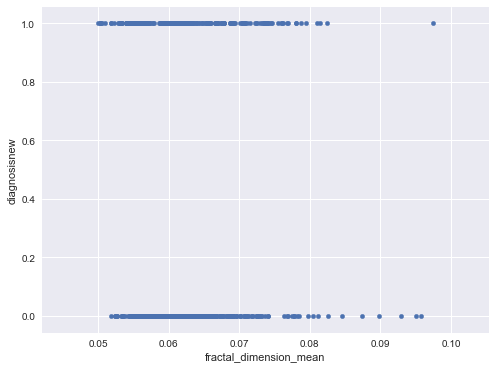

In [5]:
#Exploratory Data Analysis Part 1
breastcancerdata.plot(kind='scatter', x='radius_mean', y='diagnosisnew')
breastcancerdata.plot(kind='scatter', x='texture_mean', y='diagnosisnew')
breastcancerdata.plot(kind='scatter', x='smoothness_mean', y='diagnosisnew')
breastcancerdata.plot(kind='scatter', x='concave points_mean', y='diagnosisnew')
breastcancerdata.plot(kind='scatter', x='symmetry_mean', y='diagnosisnew')
breastcancerdata.plot(kind='scatter', x='fractal_dimension_mean', y='diagnosisnew')

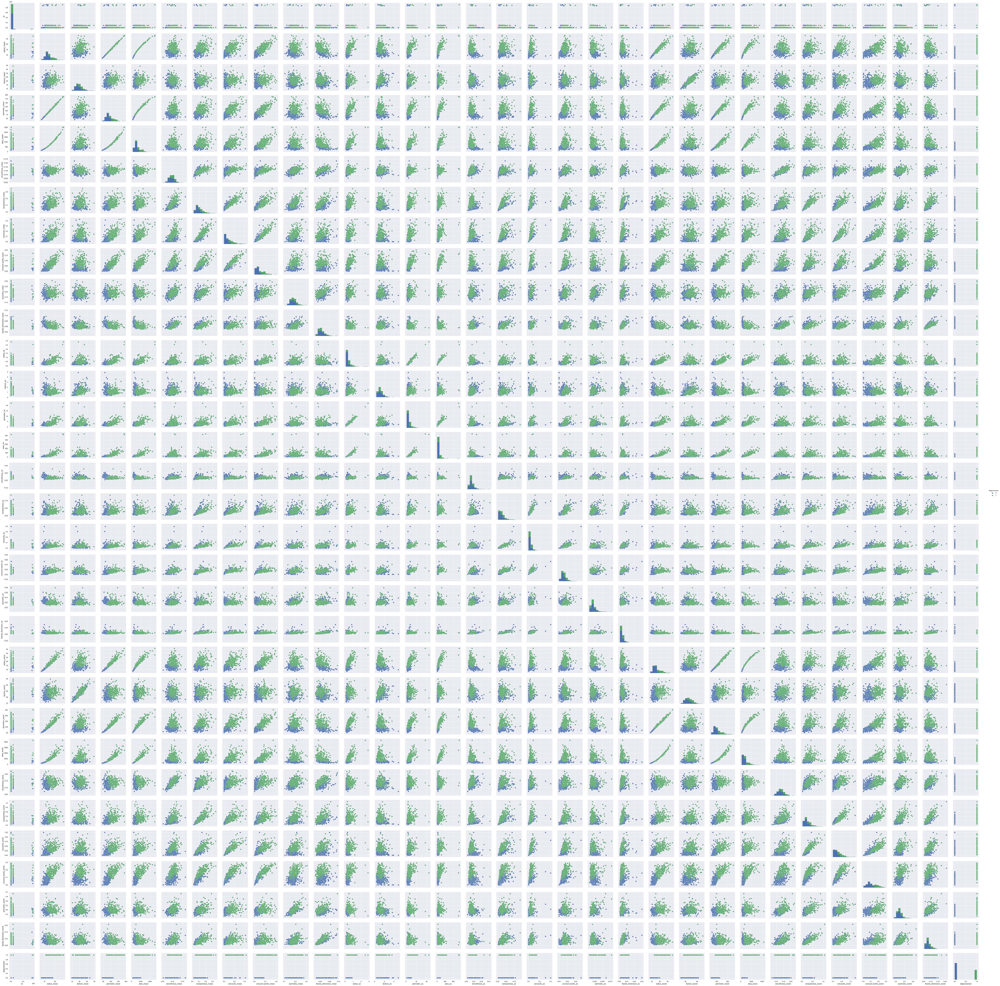

In [71]:
#Exploratory Data Analysis Part 2 - Scatter Matrix 
#Resolution here is too small. Save the image, export it and blow it up, see how the data correlates to each other.
sns.pairplot(data=breastcancerdata, vars=breastcancerdata.columns, hue="diagnosisnew")

Pairplot allows us to see which features to drop and which features to include. Not so good correlations to model (just based on eyeballing):
- fractal_dimension_mean
- texture_se
- smoothness_se
- compactness_se
- concavity_se
- symmetry_se

# Model 1: Logistic Regression With All Features

In [6]:
#Create the logreg model and instantiate
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=1e-3)
# TODO - define X, y, fit it
feature_cols = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
X1 = breastcancerdata[feature_cols]
y = breastcancerdata.diagnosisnew
logreg.fit(X1,y)

LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [7]:
#Apply logistic regression model with 10-fold cross validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(logreg, X1, y, cv=10, scoring='neg_mean_squared_error')
print((np.sqrt(-(scores)).mean()))
accuracy1 = cross_val_score(logreg, X1, y, cv=10, scoring='accuracy')
print((accuracy1.mean()))

0.265116078608
0.926211001642


# Model 2: Logistic Regression With Some Features Removed

In [8]:
# Let's remove the features above which showed little correlation
feature_cols2 = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
 'concave points_mean', 'symmetry_mean', 'radius_se', 'perimeter_se', 'area_se', 'concave points_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
X2 = breastcancerdata[feature_cols2]
y = breastcancerdata.diagnosisnew
logreg.fit(X2,y)

LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [9]:
#Apply logistic regression model again, with 10-fold cross validation
from sklearn.model_selection import cross_val_score
scores2 = cross_val_score(logreg, X2, y, cv=10, scoring='neg_mean_squared_error')
print((np.sqrt(-(scores2)).mean()))
accuracy2 = cross_val_score(logreg, X2, y, cv=10, scoring='accuracy')
print((accuracy2.mean()))

0.265116078608
0.926211001642


Seems like Model 2, with some features removed, did not yield much difference

Trying out a confusion matrix:

In [25]:
from sklearn import metrics
preds = logreg.predict(X2)
print(metrics.confusion_matrix(y, preds))

[[347  10]
 [ 31 181]]


# Model 3: K-Nearest Neighbours

In [10]:
#Instantiate KNN classifier, fit with data, 
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X1, y)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

In [13]:
#Perform cross validation on the fitted KNN Model. Find mean square error and accuracy.
scores3 = cross_val_score(knn, X1, y, cv=10, scoring='neg_mean_squared_error')
print((np.sqrt(-(scores3)).mean()))
accuracy3 = cross_val_score(knn, X1, y, cv=10, scoring='accuracy')
print(accuracy3.mean())

0.258946427958
0.929842926281


K-nearest neighbours gave a slightly lower error, and higher accuracy. Let's try to tune the parameters further to see which k gives the best result.

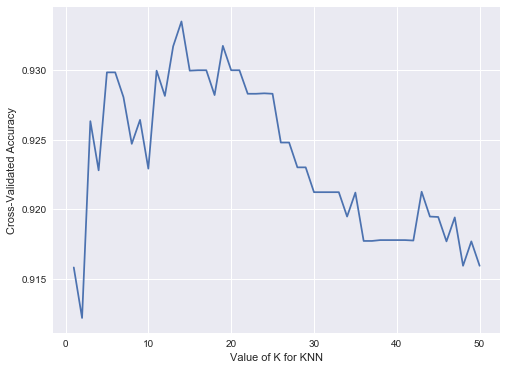

In [20]:
#Create a range of 'k's
k_range = range(1, 51)
#Empty placeholder
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X1, y, cv=10, scoring='accuracy')
    k_scores.append(scores.mean())
#Plot the graph!
plt.plot(k_range,k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

Best parameter of k is at k=14. Now, we plug that value back into the KNN model.

In [21]:
knn = KNeighborsClassifier(n_neighbors=14)
scores4 = cross_val_score(knn, X1, y, cv=14, scoring='neg_mean_squared_error')
print((np.sqrt(-(scores4)).mean()))
accuracy4 = cross_val_score(knn, X1, y, cv=14, scoring='accuracy')
print(accuracy4.mean())

0.237922157073
0.931734279077


# Model 4: Feed Forward Neural Network

In [38]:
X = np.array(breastcancerdata[feature_cols])
y = np.array(breastcancerdata['diagnosisnew'])
y_cat = pd.get_dummies(y).values

print(X.shape, y_cat.shape)

(569, 30) (569, 2)


In [44]:
#Import the neural network libraries
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.optimizers import SGD

#Defining the model
model = Sequential()

# First layer - input_dim=30 features.
model.add(Dense(units=15, input_dim=30))
model.add(Activation("tanh"))

# Hidden layer 1- input_dim=15 features.
model.add(Dense(units=6, input_dim=15))
model.add(Activation("tanh"))

# Hidden layer 2- input_dim=15 features.
model.add(Dense(units=3, input_dim=6))
model.add(Activation("tanh"))

# Output layer - output_dim=# of output per point (in y).
# Use 'softmax' for class probability. 'linear' for regression
model.add(Dense(units=2, input_dim=3))
model.add(Activation("softmax"))

# Uses Mean Squared Error and Stochastic Gradient Descent
model.compile(loss='mse', optimizer=SGD(lr=0.1))

In [49]:
#Train the neural network
loss = model.fit(X, y_cat,
                 validation_split=0.2, epochs=1000, 
                 batch_size=16, verbose=False)

print(loss.history['loss'][-1])
print("Training complete")

0.240487677678
Training complete


In [51]:
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error
#Calculate accuracy
preds = model.predict_classes(X, verbose=False)
print('ACCURACY: ', accuracy_score(y, preds))

ACCURACY:  0.630931458699


Neural networks did not do as well as logistic regression. Goes to show that sometimes the simpler models could work better!